<a href="https://colab.research.google.com/github/cateto/python4NLP/blob/main/colab/LSTM_news_classfication.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [11]:
from sklearn.model_selection import train_test_split
import pandas as pd
dataset = pd.read_csv('/content/drive/MyDrive/rsn_nlp_project/sample_0727.csv')
data = dataset['contents']
target = dataset['category']

#라벨 데이터 정수로 변환
possible_labels = target.unique()
label_dict = {}
for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index

target[:5]

target = target.replace(label_dict)

#이어서 형태소 분석 및 정수 인코딩

In [7]:
label_dict

{'IT/과학': 2,
 '경제': 1,
 '문화': 6,
 '미용/건강': 7,
 '사회': 0,
 '생활': 3,
 '스포츠': 4,
 '연예': 8,
 '정치': 5}

In [12]:
# Colab에 Mecab 설치
!git clone https://github.com/SOMJANG/Mecab-ko-for-Google-Colab.git
%cd Mecab-ko-for-Google-Colab
!bash install_mecab-ko_on_colab190912.sh

Cloning into 'Mecab-ko-for-Google-Colab'...
remote: Enumerating objects: 91, done.
remote: Counting objects: 100% (91/91), done.
remote: Compressing objects: 100% (85/85), done.
remote: Total 91 (delta 43), reused 22 (delta 6), pack-reused 0
Unpacking objects: 100% (91/91), done.
/content/Mecab-ko-for-Google-Colab
Installing konlpy.....
     |████████████████████████████████| 19.4 MB 1.4 MB/s 
     |████████████████████████████████| 86 kB 8.4 MB/s 
     |████████████████████████████████| 448 kB 50.6 MB/s 
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
    Uninstalling beautifulsoup4-4.6.3:
      Successfully uninstalled beautifulsoup4-4.6.3
Done
Installing mecab-0.996-ko-0.9.2.tar.gz.....
from https://bitbucket.org/eunjeon/mecab-ko/downloads/mecab-0.996-ko-0.9.2.tar.gz
--2021-07-27 06:12:01--  https://bitbucket.org/eunjeon/mecab-ko/downloads/mecab-0.996-ko-0.9.2.tar.gz
Resolving bitbucket.org (bitbucket.org)... 104.192.141.1, 2406:da00:ff00

In [44]:
from konlpy.tag import * 
mecab = Mecab()

In [45]:
stopwords = ['의','가','이','은','는','을','를','들','는','좀','잘','걍','과','도','를','으로','자','에','와','한','하다','월','면', '년', '개월' ,'개'
,'하','때','대하','오','말','그렇','위하','수','아니','지','않','없', '등', '다', '해', '인','데','로','며','적', '것', '고'
,'있', '했', '에서',
]

In [46]:
import re 
pre_data = []
for idx, sentence in enumerate(data):
    temp = re.sub("[^ㄱ-ㅎㅏ-ㅣ가-힣]", " ", sentence) #한글 외 제거
    temp = re.sub("[ ]{2,}", " ", temp) # 띄어쓰기 반복 경우 제거
    temp = mecab.morphs(temp) # 토큰화
    temp = [word for word in temp if not word in stopwords] # 불용어 제거
    pre_data.append(temp)

In [47]:
pre_data[1]

['현대차',
 '아이오',
 '닉',
 '야간',
 '자율',
 '주행',
 '성공',
 '라스베이거스',
 '도심',
 '거',
 '뜬',
 '기간',
 '첫',
 '시연',
 '복잡',
 '도심',
 '어려운',
 '조건',
 '불구',
 '보행자',
 '접근',
 '교통',
 '신호',
 '감지',
 '레이더',
 '센서',
 '추가',
 '완벽',
 '주행',
 '완전',
 '자율',
 '주행',
 '상용',
 '화',
 '최근',
 '자동차',
 '업계',
 '가장',
 '뜨거운',
 '이슈',
 '자율',
 '주행',
 '기술',
 '발전',
 '어디',
 '까지',
 '왔을까',
 '세계',
 '최대',
 '전자',
 '쇼인',
 '열리',
 '라스베이거스',
 '현대차',
 '아이오',
 '닉',
 '자율',
 '주행',
 '차',
 '가장',
 '까다로운',
 '조건',
 '복잡',
 '대도심',
 '야간',
 '자율',
 '주행',
 '성공',
 '면서',
 '주목',
 '받',
 '아이',
 '닉',
 '야간',
 '자율',
 '주행',
 '성공',
 '일',
 '현대차',
 '따르',
 '아이오',
 '닉',
 '자율',
 '주행',
 '차',
 '대가',
 '지난해',
 '부터',
 '라스베이거스',
 '컨벤션',
 '센터',
 '주변',
 '도심',
 '구간',
 '시범',
 '주행',
 '특히',
 '이번',
 '시연',
 '주목',
 '할',
 '만',
 '점',
 '야간',
 '자율',
 '주행',
 '포함',
 '된',
 '점',
 '야간',
 '자율',
 '주행',
 '주변',
 '조명',
 '어두워',
 '센서',
 '사람',
 '자동차',
 '사물',
 '정확',
 '위치',
 '파악',
 '기',
 '힘들',
 '뿐',
 '라',
 '각종',
 '불빛',
 '차선',
 '신호등',
 '반사',
 '되',
 '기',
 '때문',
 '인식',
 '능력',
 '떨어질',
 '밖에',
 '게다가',
 '기간',
 '중',
 '

In [122]:
from tensorflow.keras.preprocessing.text import Tokenizer
vocab_size = 1000
tokenizer = Tokenizer(num_words = vocab_size + 1, oov_token = 'OOV')
tokenizer.fit_on_texts(pre_data) # fit_on_texts()안에 코퍼스를 입력으로 하면 빈도수를 기준으로 단어 집합을 생성한다.

In [123]:
print(tokenizer.word_index)

{'OOV': 1, '울산': 2, '일': 3, '기': 4, '할': 5, '만': 6, '되': 7, '게': 8, '지역': 9, '어': 10, '원': 11, '한다': 12, '사업': 13, '된': 14, '었': 15, '명': 16, '까지': 17, '화': 18, '성': 19, '산업': 20, '시': 21, '대': 22, '중': 23, '됐': 24, '억': 25, '지만': 26, '위해': 27, '라고': 28, '면서': 29, '다는': 30, '아': 31, '전': 32, '부터': 33, '된다': 34, '받': 35, '대한': 36, '및': 37, '지원': 38, '던': 39, '문화': 40, '그': 41, '안': 42, '계획': 43, '통해': 44, '았': 45, '지난': 46, '겠': 47, '정부': 48, '될': 49, '시장': 50, '도시': 51, '추진': 52, '다고': 53, '제': 54, '울산시': 55, '에게': 56, '위한': 57, '차': 58, '의원': 59, '시민': 60, '밝혔': 61, '나': 62, '한국': 63, '이번': 64, '보': 65, '또': 66, '주': 67, '기업': 68, '후보': 69, '문제': 70, '운영': 71, '함께': 72, '권': 73, '라는': 74, '올해': 75, '교육': 76, '내': 77, '필요': 78, '도록': 79, '현대': 80, '해야': 81, '기술': 82, '보다': 83, '돼': 84, '가능': 85, '센터': 86, '당': 87, '대통령': 88, '대표': 89, '같': 90, '많': 91, '개발': 92, '경우': 93, '지난해': 94, '관련': 95, '라': 96, '진행': 97, '때문': 98, '신': 99, '경제': 100, '주민': 101, '더': 102, '간': 103, '사회': 104, '씨'

In [124]:
print(tokenizer.word_counts)

OrderedDict([('명', 7241), ('게놈', 233), ('해독', 37), ('무병장수', 11), ('새', 1332), ('장', 1575), ('연다', 65), ('울산', 23194), ('코리아', 159), ('프로젝트', 494), ('본격', 871), ('가동', 581), ('행복', 636), ('생활', 1120), ('권', 3303), ('사업', 7791), ('내년', 1648), ('까지', 7156), ('억', 5835), ('천만', 104), ('원', 8330), ('밀양', 83), ('만', 12413), ('투입', 785), ('연차', 81), ('별', 1696), ('추진', 3799), ('올', 683), ('국비', 368), ('중', 6092), ('확보', 1751), ('예산', 1887), ('수준', 1259), ('유전자', 102), ('기증', 93), ('축소', 236), ('내달', 234), ('내', 3202), ('기술', 3068), ('센터', 3016), ('구축', 1620), ('지역', 10237), ('선도', 413), ('합한', 25), ('올해', 3255), ('화', 6536), ('된다', 4767), ('통해서', 110), ('차년', 24), ('모두', 1800), ('자신', 806), ('정보', 1159), ('제공', 1132), ('받', 4753), ('예정', 2118), ('수행', 448), ('도울', 27), ('산업', 6466), ('월중', 27), ('울산시', 3720), ('기반', 1088), ('바이오', 266), ('메디컬', 119), ('육성', 959), ('일정', 661), ('이달', 605), ('협의', 1083), ('뒤', 1501), ('대상자', 135), ('모집', 358), ('공고', 172), ('낼', 174), ('계획', 4121), ('다고', 3774)

단어 인덱스(빈도수 높은 대로) 
와 단어 카운트


In [125]:
encoded = tokenizer.texts_to_sequences(pre_data)

In [126]:
encoded

[[16,
  1,
  1,
  1,
  268,
  213,
  1,
  2,
  1,
  1,
  855,
  467,
  736,
  667,
  338,
  73,
  13,
  202,
  17,
  2,
  25,
  1,
  11,
  1,
  6,
  11,
  520,
  2,
  16,
  1,
  16,
  1,
  190,
  52,
  608,
  2,
  16,
  1,
  16,
  6,
  16,
  1,
  855,
  1,
  25,
  23,
  25,
  11,
  184,
  608,
  170,
  25,
  288,
  608,
  1,
  1,
  16,
  1,
  1,
  77,
  82,
  86,
  208,
  2,
  6,
  16,
  1,
  855,
  9,
  667,
  338,
  73,
  997,
  13,
  16,
  1,
  855,
  1,
  2,
  1,
  1,
  855,
  75,
  467,
  18,
  34,
  6,
  16,
  1,
  855,
  1,
  16,
  9,
  667,
  338,
  73,
  997,
  13,
  1,
  1,
  16,
  177,
  16,
  503,
  1,
  1,
  1,
  1,
  321,
  330,
  35,
  145,
  1,
  1,
  855,
  937,
  1,
  2,
  1,
  20,
  82,
  86,
  1,
  77,
  208,
  34,
  55,
  9,
  667,
  338,
  73,
  997,
  13,
  1,
  353,
  1,
  1,
  20,
  421,
  13,
  636,
  706,
  23,
  355,
  228,
  1,
  1,
  1,
  1,
  1,
  43,
  53,
  3,
  61,
  94,
  58,
  13,
  44,
  2,
  60,
  16,
  719,
  190,
  1,
  1,
  158,
  85,
  1,
  1,


In [127]:
x_train, x_valid, y_train, y_valid = train_test_split(encoded, target, test_size=0.2, shuffle=True, stratify=target, random_state=34)

In [128]:
x_train[0]

[1,
 1,
 1,
 1,
 1,
 1,
 514,
 1,
 109,
 1,
 1,
 177,
 1,
 1,
 22,
 68,
 1,
 1,
 6,
 3,
 1,
 75,
 1,
 1,
 1,
 177,
 1,
 1,
 1,
 1,
 30,
 109,
 153,
 1,
 123,
 22,
 68,
 632,
 677,
 1,
 1,
 1,
 420,
 15,
 3,
 767,
 1,
 514,
 1,
 1,
 16,
 211,
 1,
 1,
 43,
 1,
 255,
 153,
 197,
 75,
 1,
 1,
 1,
 3,
 1,
 1,
 3,
 177,
 1,
 1,
 524,
 738,
 3,
 3,
 177,
 1,
 451,
 1,
 3,
 1,
 1,
 6,
 1,
 1,
 3,
 1,
 1,
 6,
 1,
 1,
 362,
 68,
 155,
 190,
 65,
 22,
 68,
 1,
 3,
 177,
 1,
 1,
 738,
 677,
 1,
 1,
 738,
 3,
 3,
 177,
 1,
 451,
 1,
 22,
 68,
 1,
 1,
 26,
 677,
 1,
 130,
 465,
 1,
 362,
 1,
 1,
 1,
 308,
 1,
 12,
 61,
 41,
 366,
 1,
 406,
 939,
 222,
 1,
 492,
 312,
 1,
 366,
 162,
 485,
 1,
 45,
 3,
 91,
 1,
 1,
 222,
 1,
 1,
 362,
 331,
 112,
 16,
 23,
 16,
 64,
 1,
 1,
 760,
 1,
 43,
 613,
 1,
 153,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 185,
 16,
 211,
 1,
 153,
 64,
 1,
 1,
 760,
 5,
 145,
 28,
 1,
 1,
 1,
 22,
 1,
 689,
 760,
 43,
 30,
 1,
 196,
 760,
 1,
 1,
 47,
 53,
 609,
 1,
 116,
 1,
 190,

In [129]:
y_train[0]

0

- test_size: 테스트 셋 구성의 비율을 나타냅니다. train_size의 옵션과 반대 관계에 있는 옵션 값이며, 주로 test_size를 지정해 줍니다. 0.2는 전체 데이터 셋의 20%를 test (validation) 셋으로 지정하겠다는 의미입니다. default 값은 0.25 입니다.
- shuffle: default=True 입니다. split을 해주기 이전에 섞을건지 여부입니다. 보통은 default 값으로 놔둡니다.
- stratify: default=None 입니다. classification을 다룰 때 매우 중요한 옵션값입니다. stratify 값을 target으로 지정해주면 각각의 class 비율(ratio)을 train / validation에 유지해 줍니다. (한 쪽에 쏠려서 분배되는 것을 방지합니다) 만약 이 옵션을 지정해 주지 않고 classification 문제를 다룬다면, 성능의 차이가 많이 날 수 있습니다.
- random_state: 세트를 섞을 때 해당 int 값을 보고 섞으며, 하이퍼 파라미터를 튜닝시 이 값을 고정해두고 튜닝해야 매번 데이터셋이 변경되는 것을 방지할 수 있습니다.

In [130]:
print('원본 뉴스 기사 : {}'.format(len(data)))
print('훈련용 뉴스 기사 : {}'.format(len(x_train)))
print('테스트용 뉴스 기사 : {}'.format(len(x_valid)))
num_classes = max(y_train) + 1
print('카테고리 : {}'.format(num_classes))

원본 뉴스 기사 : 5718
훈련용 뉴스 기사 : 4574
테스트용 뉴스 기사 : 1144
카테고리 : 9


뉴스 기사의 최대 길이 :1218
뉴스 기사의 평균 길이 :383.2197201574115


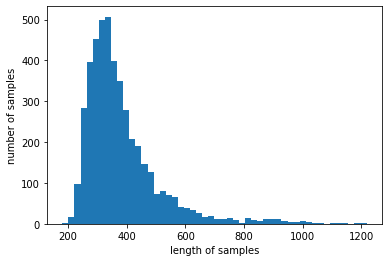

In [131]:
print('뉴스 기사의 최대 길이 :{}'.format(max(len(l) for l in x_train)))
print('뉴스 기사의 평균 길이 :{}'.format(sum(map(len, x_train))/len(x_train)))

plt.hist([len(s) for s in x_train], bins=50)
plt.xlabel('length of samples')
plt.ylabel('number of samples')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


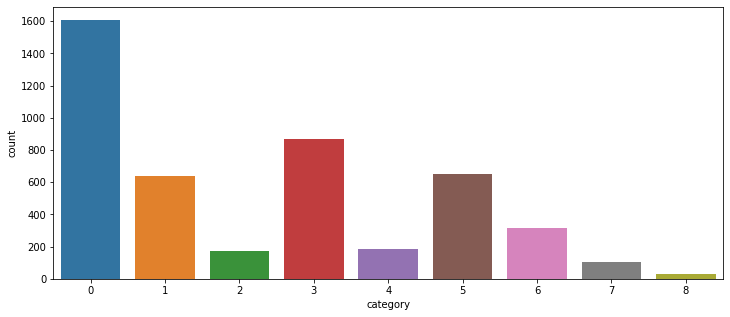

In [132]:
fig, axe = plt.subplots(ncols=1)
fig.set_size_inches(12,5)
sns.countplot(y_train)

In [133]:
unique_elements, counts_elements = np.unique(y_train, return_counts=True)
print("각 레이블에 대한 빈도수:")
print(np.asarray((unique_elements, counts_elements)))
# label_cnt=dict(zip(unique_elements, counts_elements))
# 아래의 출력 결과가 보기 불편하여 병렬로 보고싶다면 위의 label_cnt를 출력

각 레이블에 대한 빈도수:
[[   0    1    2    3    4    5    6    7    8]
 [1608  641  173  869  183  651  314  106   29]]


In [134]:
word_to_index = tokenizer.word_index
print(word_to_index)

{'OOV': 1, '울산': 2, '일': 3, '기': 4, '할': 5, '만': 6, '되': 7, '게': 8, '지역': 9, '어': 10, '원': 11, '한다': 12, '사업': 13, '된': 14, '었': 15, '명': 16, '까지': 17, '화': 18, '성': 19, '산업': 20, '시': 21, '대': 22, '중': 23, '됐': 24, '억': 25, '지만': 26, '위해': 27, '라고': 28, '면서': 29, '다는': 30, '아': 31, '전': 32, '부터': 33, '된다': 34, '받': 35, '대한': 36, '및': 37, '지원': 38, '던': 39, '문화': 40, '그': 41, '안': 42, '계획': 43, '통해': 44, '았': 45, '지난': 46, '겠': 47, '정부': 48, '될': 49, '시장': 50, '도시': 51, '추진': 52, '다고': 53, '제': 54, '울산시': 55, '에게': 56, '위한': 57, '차': 58, '의원': 59, '시민': 60, '밝혔': 61, '나': 62, '한국': 63, '이번': 64, '보': 65, '또': 66, '주': 67, '기업': 68, '후보': 69, '문제': 70, '운영': 71, '함께': 72, '권': 73, '라는': 74, '올해': 75, '교육': 76, '내': 77, '필요': 78, '도록': 79, '현대': 80, '해야': 81, '기술': 82, '보다': 83, '돼': 84, '가능': 85, '센터': 86, '당': 87, '대통령': 88, '대표': 89, '같': 90, '많': 91, '개발': 92, '경우': 93, '지난해': 94, '관련': 95, '라': 96, '진행': 97, '때문': 98, '신': 99, '경제': 100, '주민': 101, '더': 102, '간': 103, '사회': 104, '씨'

In [135]:
index_to_word = {}
for key, value in word_to_index.items():
    index_to_word[value] = key

In [139]:
print('빈도수 상위 1번 단어 : {}'.format(index_to_word[1]))

빈도수 상위 1번 단어 : OOV


왜이러지>?????????

In [137]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model

In [140]:
MAX_LEN = 100
new_train = pad_sequences(x_train, maxlen=MAX_LEN) # 훈련용 뉴스 기사 패딩
new_test = pad_sequences(x_valid, maxlen=MAX_LEN) # 테스트용 뉴스 기사 패딩

In [141]:
label_train = to_categorical(y_train) # 훈련용 뉴스 기사 레이블의 원-핫 인코딩
label_test = to_categorical(y_valid) # 테스트용 뉴스 기사 레이블의 원-핫 인코딩

In [146]:
model = Sequential()
model.add(Embedding(1001, 120))
model.add(LSTM(120))
model.add(Dense(9, activation='softmax'))

In [147]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=4)
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)

In [148]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [149]:
history = model.fit(new_train, label_train, batch_size=128, epochs=30, callbacks=[es, mc], validation_data=(new_test, label_test))

Epoch 1/30
36/36 [==============================] - 14s 320ms/step - loss: 1.8913 - acc: 0.3498 - val_loss: 1.7924 - val_acc: 0.3514

Epoch 00001: val_acc improved from -inf to 0.35140, saving model to best_model.h5
Epoch 2/30
36/36 [==============================] - 11s 308ms/step - loss: 1.7776 - acc: 0.3516 - val_loss: 1.7638 - val_acc: 0.3514

Epoch 00002: val_acc did not improve from 0.35140
Epoch 3/30
36/36 [==============================] - 11s 308ms/step - loss: 1.6756 - acc: 0.3741 - val_loss: 1.5804 - val_acc: 0.4170

Epoch 00003: val_acc improved from 0.35140 to 0.41696, saving model to best_model.h5
Epoch 4/30
36/36 [==============================] - 11s 308ms/step - loss: 1.3566 - acc: 0.5039 - val_loss: 1.3957 - val_acc: 0.4808

Epoch 00004: val_acc improved from 0.41696 to 0.48077, saving model to best_model.h5
Epoch 5/30
36/36 [==============================] - 11s 307ms/step - loss: 1.1487 - acc: 0.5938 - val_loss: 1.2457 - val_acc: 0.5490

Epoch 00005: val_acc improve